# Prédire le prix d'un bien immobilier

In [1]:
import pandas as pd
features = pd.read_csv("/Users/abbasmzehamadi/Downloads/X_train_J01Z4CN.csv")
print(features.info())
features.head()

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id_annonce                   37368 non-null  int64  
 1   property_type                37368 non-null  object 
 2   approximate_latitude         37368 non-null  float64
 3   approximate_longitude        37368 non-null  float64
 4   city                         37368 non-null  object 
 5   postal_code                  37368 non-null  int64  
 6   size                         36856 non-null  float64
 7   floor                        9743 non-null   float64
 8   land_size                    15581 non-null  float64
 9   energy_performance_value     19068 non-null  float64
 10  energy_performance_category  19068 non-null  object 
 11  ghg_value                    18530 non-null  float64
 12  ghg_category                 18530 non-null  object 
 13  exposition      

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,nb_parking_places,nb_boxes,nb_photos,has_a_balcony,nb_terraces,has_a_cellar,has_a_garage,has_air_conditioning,last_floor,upper_floors
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,0.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,0.0,1.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,0.0,1.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [2]:
# Target
labels = pd.read_csv("/Users/abbasmzehamadi/Downloads/y_train_OXxrJt1.csv")
print(labels.info())
labels.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id_annonce  37368 non-null  int64  
 1   price       37368 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 584.0 KB
None


,id_annonce,price
0,35996577,355000.0
1,35811033,190000.0
2,35731841,39000.0
3,35886765,299000.0
4,35781137,478000.0


In [4]:
df = features.merge(labels, on='id_annonce')
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id_annonce                   37368 non-null  int64  
 1   property_type                37368 non-null  object 
 2   approximate_latitude         37368 non-null  float64
 3   approximate_longitude        37368 non-null  float64
 4   city                         37368 non-null  object 
 5   postal_code                  37368 non-null  int64  
 6   size                         36856 non-null  float64
 7   floor                        9743 non-null   float64
 8   land_size                    15581 non-null  float64
 9   energy_performance_value     19068 non-null  float64
 10  energy_performance_category  19068 non-null  object 
 11  ghg_value                    18530 non-null  float64
 12  ghg_category                 18530 non-null  object 
 13  exposition      

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,nb_boxes,nb_photos,has_a_balcony,nb_terraces,has_a_cellar,has_a_garage,has_air_conditioning,last_floor,upper_floors,price
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,355000.0
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,190000.0
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39000.0
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,1.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,299000.0
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,1.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,478000.0


In [5]:
df.isna().sum()

id_annonce                         0
property_type                      0
approximate_latitude               0
approximate_longitude              0
city                               0
postal_code                        0
size                             512
floor                          27625
land_size                      21787
energy_performance_value       18300
energy_performance_category    18300
ghg_value                      18838
ghg_category                   18838
exposition                     28274
nb_rooms                        1566
nb_bedrooms                     2733
nb_bathrooms                   13273
nb_parking_places                  0
nb_boxes                           0
nb_photos                          0
has_a_balcony                      0
nb_terraces                        0
has_a_cellar                       0
has_a_garage                       0
has_air_conditioning               0
last_floor                         0
upper_floors                       0
p

In [6]:
df.duplicated().sum()

0

Nous allons effectuer le ***train-test split*** dès maintenant afin d’éviter tout risque de data leakage (fuite de données). En effet, lors de l’analyse exploratoire, nous serons amenés à appliquer différentes méthodes et transformations sur les données. Si ces opérations sont réalisées directement sur l’ensemble du DataFrame **"df"**, cela pourrait introduire des informations du jeu de test dans le jeu d’entraînement, biaisant ainsi les résultats et l’apprentissage du modèle.

In [7]:
from sklearn.model_selection import train_test_split  
seed=123
train_set, test_set = train_test_split(df.drop('id_annonce', axis=1), test_size=0.2,random_state=seed)
print("train.shape:", train_set.shape, "test_shape:", test_set.shape)

train.shape: (29894, 27) test_shape: (7474, 27)


# Analyse exploratoire

Pour éviter le phénomène de data leakage, on va créer une copie du jeu d'entraînement, que l'on utilisera uniquement pour l’analyse exploratoire. Ainsi, on ne modifie ni le jeu d’entraînement original ni le jeu de test, qui seront utilisés plus tard dans la phase de modélisation.

In [8]:
real_estate = train_set.copy()

## Feature Engineering

In [9]:
real_estate['living_area_per_total_land'] = real_estate['size']/real_estate['land_size']
real_estate['living_area_per_total_land']

10813           NaN
28163    262.088235
2732       0.015584
11636           NaN
34955           NaN
            ...    
7763       0.034836
15377      0.030000
17730      0.719424
28030           NaN
15725      0.226777
Name: living_area_per_total_land, Length: 29894, dtype: float64

In [10]:
real_estate['total_number_of_rooms'] = real_estate['nb_rooms'] + real_estate['nb_bedrooms'] + real_estate['nb_bathrooms']
real_estate['total_number_of_rooms']

10813    11.0
28163     8.0
2732     11.0
11636     NaN
34955     NaN
         ... 
7763      8.0
15377     NaN
17730    15.0
28030     NaN
15725     8.0
Name: total_number_of_rooms, Length: 29894, dtype: float64

In [11]:
real_estate['bedrooms_per_room'] = real_estate['nb_bedrooms']/real_estate['total_number_of_rooms']
real_estate['bedrooms_per_room']

10813    0.454545
28163    0.375000
2732     0.272727
11636         NaN
34955         NaN
           ...   
7763     0.375000
15377         NaN
17730    0.400000
28030         NaN
15725    0.375000
Name: bedrooms_per_room, Length: 29894, dtype: float64

In [12]:
real_estate['total_parking_capacity'] = real_estate['nb_parking_places'] + real_estate['nb_boxes']
real_estate['total_parking_capacity']

10813    1.0
28163    0.0
2732     0.0
11636    0.0
34955    0.0
        ... 
7763     0.0
15377    1.0
17730    0.0
28030    1.0
15725    1.0
Name: total_parking_capacity, Length: 29894, dtype: float64

In [13]:
real_estate['num_ameneties'] = real_estate['has_a_balcony'] + real_estate['has_a_cellar'] + real_estate['has_a_garage'] + real_estate['has_air_conditioning']
real_estate['num_ameneties']

10813    1.0
28163    0.0
2732     0.0
11636    0.0
34955    0.0
        ... 
7763     0.0
15377    0.0
17730    1.0
28030    1.0
15725    1.0
Name: num_ameneties, Length: 29894, dtype: float64

In [16]:
!pip install geopy

In [18]:
from geopy.distance import geodesic

# Coordonnée de Paris (Tour Eiffel)
paris_latitude = 48.858370
paris_longitude = 2.294481

# Fonction pour calculer la distance entre paris et un point du jeu de données
def calculate_distance(row):
    point_latitude = row['approximate_latitude']
    point_longitude = row['approximate_longitude']
    point_coordinates = (point_latitude, point_longitude)
    paris_coordinates = (paris_latitude, paris_longitude)
    distance = geodesic(point_coordinates, paris_coordinates).km
    return distance

# Application au DataFrame
real_estate['distance_to_paris'] = real_estate.apply(calculate_distance, axis=1)
real_estate['distance_to_paris'] 

10813     10.223255
28163    438.637920
2732     349.514431
11636    308.683589
34955    694.013322
            ...    
7763     230.060205
15377    192.529959
17730    343.553036
28030    305.093606
15725    421.132323
Name: distance_to_paris, Length: 29894, dtype: float64

In [19]:
# Vérification
real_estate[['city', 'distance_to_paris']].sample(5)

,city,distance_to_paris
13610,biot,689.204769
1192,gisors,60.836754
18329,saint-maur-des-fosses,16.091738
13078,saint-cezaire-sur-siagne,675.295446
16397,saint-brevin-les-pins,377.559291


In [20]:
# Résumé statistique
real_estate.describe().T

,count,mean,std,min,25%,50%,75%,max
approximate_latitude,29894.0,46.554705,2.354314,41.374436,43.930923,46.965949,48.842526,5.104601e+01
approximate_longitude,29894.0,2.607762,2.592422,-4.733545,1.089791,2.378397,4.567152,9.483665e+00
postal_code,29894.0,53712.291898,28786.435880,1000.000000,30210.000000,59000.000000,78230.000000,9.588000e+04
size,29477.0,1095.707060,5629.776972,1.000000,73.000000,115.000000,239.000000,4.113110e+05
floor,7813.0,3.457827,6.628996,1.000000,1.000000,2.000000,4.000000,5.500000e+01
land_size,12424.0,4005.178686,59071.859008,1.000000,363.000000,797.000000,1836.250000,6.203700e+06
energy_performance_value,15210.0,206.996121,872.853538,0.000000,125.000000,180.000000,240.000000,1.000000e+05
ghg_value,14791.0,32.323372,322.041271,0.000000,8.000000,16.000000,36.000000,1.702400e+04
nb_rooms,28634.0,4.234826,2.935642,0.000000,3.000000,4.000000,5.000000,1.250000e+02
nb_bedrooms,27707.0,2.854946,2.147069,0.000000,2.000000,3.000000,4.000000,1.180000e+02


In [24]:
# Table de fréquence de mes variables qualitatives
for col in list(real_estate.select_dtypes(include='object')):
    print('---------Colonne:', col, 'avec', real_estate[col].nunique(), 'modalités-------')
    print(real_estate[col].value_counts(normalize=True))
    print('\n')

---------Colonne: property_type avec 22 modalités-------
property_type
appartement          0.421757
maison               0.419315
divers               0.057403
terrain              0.041614
villa                0.020272
propriété            0.010470
terrain à bâtir      0.007794
duplex               0.005921
viager               0.004616
ferme                0.003512
parking              0.002710
loft                 0.001338
chalet               0.001338
château              0.000602
moulin               0.000368
manoir               0.000335
péniche              0.000201
hôtel particulier    0.000167
chambre              0.000134
gîte                 0.000067
hôtel                0.000033
atelier              0.000033
Name: proportion, dtype: float64


---------Colonne: city avec 7702 modalités-------
city
toulouse                0.012544
montpellier             0.010035
paris-16eme             0.006590
paris-17eme             0.006322
paris-18eme             0.006055
              

array([[<Axes: title={'center': 'approximate_latitude'}>,
        <Axes: title={'center': 'approximate_longitude'}>,
        <Axes: title={'center': 'postal_code'}>,
        <Axes: title={'center': 'size'}>,
        <Axes: title={'center': 'floor'}>],
       [<Axes: title={'center': 'land_size'}>,
        <Axes: title={'center': 'energy_performance_value'}>,
        <Axes: title={'center': 'ghg_value'}>,
        <Axes: title={'center': 'nb_rooms'}>,
        <Axes: title={'center': 'nb_bedrooms'}>],
       [<Axes: title={'center': 'nb_bathrooms'}>,
        <Axes: title={'center': 'nb_parking_places'}>,
        <Axes: title={'center': 'nb_boxes'}>,
        <Axes: title={'center': 'nb_photos'}>,
        <Axes: title={'center': 'has_a_balcony'}>],
       [<Axes: title={'center': 'nb_terraces'}>,
        <Axes: title={'center': 'has_a_cellar'}>,
        <Axes: title={'center': 'has_a_garage'}>,
        <Axes: title={'center': 'has_air_conditioning'}>,
        <Axes: title={'center': 'last_f

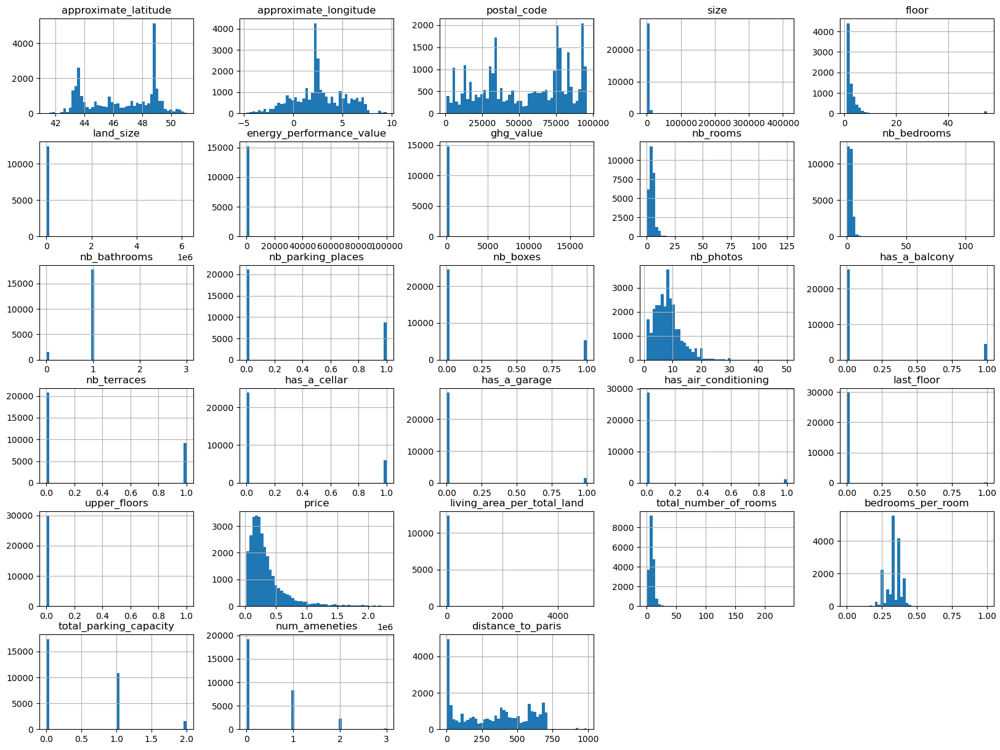

In [26]:
# Histogrammes
real_estate.hist(bins=50, figsize=(20, 15))

In [28]:
import plotly.express as px
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude')

In [29]:
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude', size="price", color="price")

In [30]:
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude', size="price", color="property_type")

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [34]:
px.scatter(real_estate[(real_estate['property_type'] == 'appartement') | (real_estate['property_type'] == 'maison')],
           x='approximate_longitude', y='approximate_latitude', size="price", color="property_type")

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: >

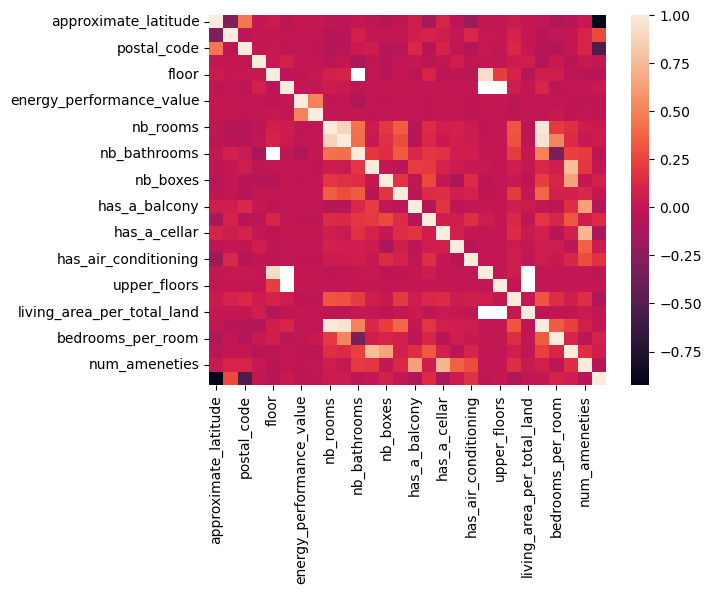

In [37]:
# Carte de correlation
import seaborn as sns
real_estate_num = real_estate.select_dtypes(include='number')
sns.heatmap(real_estate_num.corr())


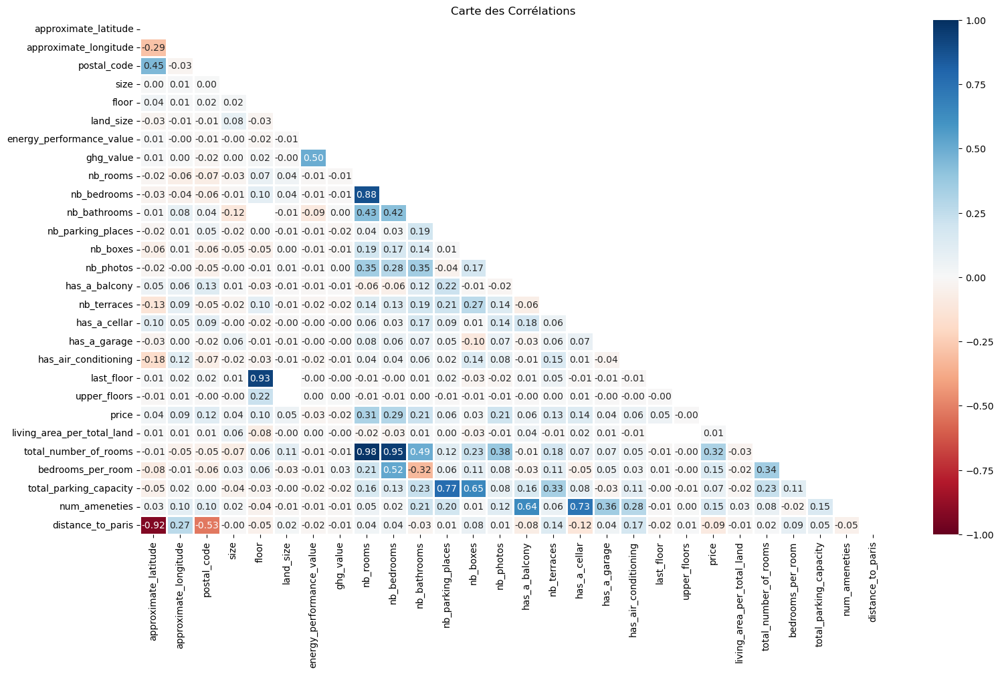

In [41]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(18,10))
real_estate_corr = real_estate_num.corr()
mask = np.triu(np.ones_like(real_estate_corr, dtype=bool))
sns.heatmap(
    real_estate_corr, mask=mask, center=0,
    cmap='RdBu', linewidths=1, annot=True, 
    fmt=".2f", vmin=-1, vmax=1
)
plt.title("Carte des Corrélations")
plt.show()

--------------prince VS property_type -------------------
property_type
parking              5.801333e+04
chambre              1.063750e+05
terrain à bâtir      1.083508e+05
terrain              1.218439e+05
viager               1.785017e+05
divers               3.059696e+05
ferme                3.214845e+05
maison               3.255814e+05
appartement          3.720782e+05
chalet               3.986384e+05
duplex               4.086984e+05
moulin               4.706545e+05
hôtel                4.910000e+05
loft                 5.049762e+05
villa                5.257610e+05
gîte                 5.550000e+05
propriété            6.504257e+05
péniche              6.925000e+05
hôtel particulier    7.083800e+05
manoir               7.822050e+05
château              1.078403e+06
atelier              1.300000e+06
Name: price, dtype: float64


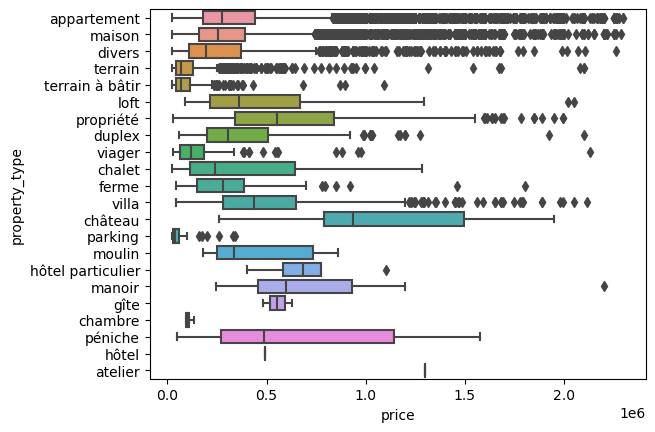

--------------prince VS energy_performance_category -------------------
energy_performance_category
G    216562.129921
F    246950.354994
E    303041.066362
D    352285.848458
A    384611.190283
C    434601.926242
B    439656.787755
Name: price, dtype: float64


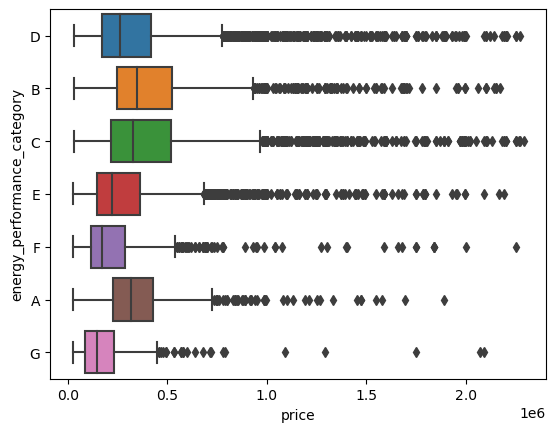

--------------prince VS ghg_category -------------------
ghg_category
G    279869.831325
F    339485.526673
C    355154.803291
B    355794.675676
E    377837.122372
A    379216.728705
D    387317.205590
Name: price, dtype: float64


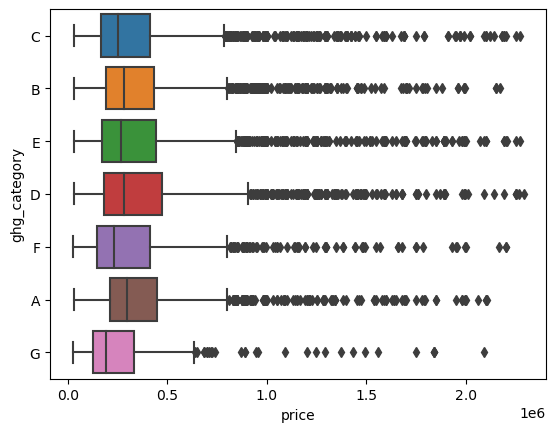

--------------prince VS exposition -------------------
exposition
Nord          306179.398907
Nord-Ouest    321697.211111
Sud-Nord      358697.864286
Ouest         366705.218513
Est           367180.910394
Sud           392291.823234
Sud-Est       402456.744764
Est-Ouest     405793.345921
Nord-Est      435204.138889
Sud-Ouest     441905.737810
Nord-Sud      496062.142857
Ouest-Est     512836.821429
Name: price, dtype: float64


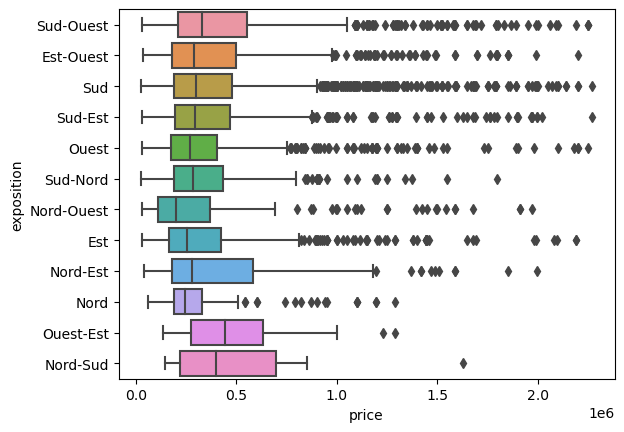

In [43]:
for col in list(real_estate.select_dtypes(include='object').drop('city', axis=1)):
    print("--------------prince VS", col, "-------------------")
    print(real_estate.groupby(col)['price'].mean().sort_values())
    sns.boxplot(data=real_estate, x='price', y=col)
    plt.show()
    plt.close()

# Data preprocessing

In [60]:
trainset = train_set.copy()

In [61]:
X_train = trainset.drop("price", axis=1)
y_train = trainset['price']

## Pipeline de prétraitement des variables numériques

In [62]:
vars_num = list(trainset.drop('price', axis=1).select_dtypes(exclude='object'))

def add_features(X):
    Z = X.copy()
    Z['living_area_per_total_land'] = Z['size']/Z['land_size']
   # real_estate['total_number_of_rooms'] = real_estate['nb_rooms'] + real_estate['nb_bedrooms'] + real_estate['nb_bathrooms']
   # Z['bedrooms_per_room'] = Z['nb_bedrooms']/Z['total_number_of_rooms']
    Z['total_parking_capacity'] = Z['nb_parking_places'] + Z['nb_boxes']
    Z['num_ameneties'] = Z['has_a_balcony'] + Z['has_a_cellar'] + Z['has_a_garage'] + Z['has_air_conditioning']
    Z['distance_to_paris'] = Z.apply(calculate_distance, axis=1)
    return Z.values


from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer


num_pipeline = Pipeline([
    ('feats_adder', FunctionTransformer(add_features)),
    ('num_impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

num_pipeline

Pipeline(steps=[('feats_adder',
                 FunctionTransformer(func=<function add_features at 0x13b6e9d00>)),
                ('num_impute', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler())])

## Pipeline de prétraitement des variables catégorielles

In [63]:
vars_cat = list(trainset.select_dtypes(include='object').drop('city', axis=1))

cat_pipeline = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='constant', fill_value="UNKNOWN")),
    ('encoder', OneHotEncoder(sparse_output=False, handle_unknown='ignore'))
])
cat_pipeline

Pipeline(steps=[('cat_imputer',
                 SimpleImputer(fill_value='UNKNOWN', strategy='constant')),
                ('encoder',
                 OneHotEncoder(handle_unknown='ignore', sparse_output=False))])

## Combinaison des deux pipelines en un seul pipeline

In [64]:
from sklearn.compose import ColumnTransformer
preprocessor = ColumnTransformer([
    ("num", num_pipeline, vars_num),
    ("cat", cat_pipeline, vars_cat)
])
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('feats_adder',
                                                  FunctionTransformer(func=<function add_features at 0x13b6e9d00>)),
                                                 ('num_impute',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 ['approximate_latitude',
                                  'approximate_longitude', 'postal_code',
                                  'size', 'floor', 'land_size',
                                  'energy_performance_value', 'ghg_value',
                                  'nb_rooms',...
                                  'has_a_balcony', 'nb_terraces',
                                  'has_a_cellar', 'has_a_garage',
                                  'has_air_conditioning', 'last_floor',
                                  'upper_floors']),
                                ('cat',
                                 Pipeline(steps=[('cat_imputer',
                                                  SimpleImputer(fill_value='UNKNOWN',
                                                                strategy='constant')),
                                                 ('encoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['property_type',
                                  'energy_performance_category', 'ghg_category',
                                  'exposition'])])

In [65]:
# Application aux données d'entrainement

X_train_prepared = preprocessor.fit_transform(X_train)
print(X_train_prepared.shape)
X_train_prepared

(29894, 76)


array([[ 0.98030347, -0.06715911,  1.36829606, ...,  0.        ,
         0.        ,  1.        ],
       [-0.39282477, -1.40638835, -1.26840651, ...,  0.        ,
         0.        ,  1.        ],
       [-0.24320179, -0.84242234, -1.2979348 , ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-0.2605051 , -0.70053739, -1.29550306, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.90957735, -1.71950283, -0.6410172 , ...,  0.        ,
         0.        ,  1.        ],
       [-0.09496148,  1.48887805,  0.71172586, ...,  0.        ,
         0.        ,  1.        ]])

## Expérimentations ML pour la séléction de modèle

In [68]:
# Régression linéaire

from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_train_prepared, y_train)

LinearRegression()

In [71]:
!pip install -U scikit-learn


In [76]:
# Prédictions
y_train_preds = lin_reg.predict(X_train_prepared)


# RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_train, y_train_preds)
lin_rmse = np.sqrt(mse)
lin_rmse

269668.428722005

In [91]:
# Validation croisée
from sklearn.model_selection import cross_val_score
scores = cross_val_score(lin_reg, X_train_prepared, y_train, scoring="neg_mean_squared_error", cv=3)
lin_rmse_scores = np.sqrt(-scores)
lin_rmse_scores



array([271108.4258325 , 273478.73239744, 271804.31184099])

In [92]:
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation", scores.std())

In [93]:
display_scores(lin_rmse_scores)

Scores: [271108.4258325  273478.73239744 271804.31184099]
Mean: 272130.4900236421
Standard deviation 994.7805312655596


In [102]:
def train_and_evaluate(ml_algo):
    reg = ml_algo
    reg.fit(X_train_prepared, y_train)
    
    y_train_predictions = reg.predict(X_train_prepared)
    mse = mean_squared_error(y_train, y_train_predictions)
    reg_rmse = np.sqrt(mse)
    print("RMSE:", reg_rmse)
    
    reg_scores = cross_val_score(reg, X_train_prepared, y_train, scoring="neg_mean_squared_error", cv=5)
    reg_rmse_scores = np.sqrt(-reg_scores)
    display_scores(reg_rmse_scores)
    return reg
    
    
    

In [103]:
#!pip install xgboost


In [104]:
all_models = []
from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.neural_network import MLPRegressor
for ml_algo in [RandomForestRegressor(random_state=seed),XGBRegressor(random_state=seed), MLPRegressor(random_state=seed, max_iter=500)]:
    print(ml_algo)
    model = train_and_evaluate(ml_algo)
    all_models.append(model)
    print('\n')

RandomForestRegressor(random_state=123)
RMSE: 56743.20147351501
Scores: [156356.00798995 162502.9179965  148732.40614132 149692.83584422
 162920.22829344]
Mean: 156040.87925308602
Standard deviation 6048.043128276393


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)
RMSE: 106577.52142910626
Scores

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



RMSE: 267260.9697714484


/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



Scores: [270440.62995994 277495.94128165 265521.48830496 267115.74669522
 279318.36253178]
Mean: 271978.43375470926
Standard deviation 5513.985024518268




/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



Pour le modèle Random Forest, l'écart entre la RMSE sur l'entraînement et celle obtenue par validation croisée est très important : la RMSE en validation est environ trois fois plus élevée. Cela suggère un phénomène d'overfitting.

En revanche, pour le modèle XGBoost, l'écart entre les deux scores est modéré, ce qui indique une meilleure capacité de généralisation.

Enfin, le dernier modèle (MLPRegressor) n’a pas convergé, ce qui rend ses résultats peu fiables.

👉 Nous retenons donc le modèle XGBoost comme le meilleur compromis entre performance et généralisation.



# Réglage des hyperparamètres

In [121]:
from sklearn.feature_selection import RFE


num_pipeline = Pipeline([
    ('feats_adder', FunctionTransformer(add_features)),
    ('num_impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])


cat_pipeline = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='constant', fill_value="UNKNOWN")),
    ('encoder', OneHotEncoder(sparse_output=False, handle_unknown='ignore'))
])


preprocessor = ColumnTransformer([
    ("num", num_pipeline, vars_num),
    ("cat", cat_pipeline, vars_cat)
])

rfe_selector = RFE(estimator=XGBRegressor(random_state=seed), verbose=1)


full_pipeline = Pipeline([
    ("preprocess", preprocessor),
    ("feature_selection", rfe_selector),
    ("model", XGBRegressor(random_state=seed))
])



#full_pipeline = Pipeline([
    #("preprocess", preprocessor),
    #('model', XGBRegressor(random_state=seed))
#])

full_pipeline

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('feats_adder',
                                                                   FunctionTransformer(func=<function add_features at 0x13b6e9d00>)),
                                                                  ('num_impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['approximate_latitude',
                                                   'approximate_longitude',
                                                   'postal_code', 'size',
                                                   'floor', 'land_size',
                                                   'energy_performance_...
                              feature_types=None, feature_weights=None,
                              gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, ...))])

In [122]:
full_pipeline[2]

RFE(estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
                           colsample_bylevel=None, colsample_bynode=None,
                           colsample_bytree=None, device=None,
                           early_stopping_rounds=None, enable_categorical=False,
                           eval_metric=None, feature_types=None,
                           feature_weights=None, gamma=None, grow_policy=None,
                           importance_type=None, interaction_constraints=None,
                           learning_rate=None, max_bin=None,
                           max_cat_threshold=None, max_cat_to_onehot=None,
                           max_delta_step=None, max_depth=None, max_leaves=None,
                           min_child_weight=None, missing=nan,
                           monotone_constraints=None, multi_strategy=None,
                           n_estimators=None, n_jobs=None,
                           num_parallel_tree=None, ...),
    verbose=1)

In [123]:
X_train = train_set.drop('price', axis=1)
y_train = train_set['price']

In [124]:
from scipy.stats import randint

param_dist = {
    'model__n_estimaotrs':randint(low=50, high=200),
    'model__max_depth': randint(low=1, high=20),
    'model__learning_rate': np.arange(0.05, 1, 0.05),
    'model__colsample_bytree': np.arange(0.05, 1, 0.05)
}

from sklearn.model_selection import RandomizedSearchCV
rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_dist,
    n_iter=15, cv=3, scoring='neg_mean_squared_error',
    random_state=seed, n_jobs=-1
)

rnd_search.fit(X_train, y_train)

print("Meilleurs hyperparamètres :", rnd_search.best_params_)
print("Meilleur score:", np.sqrt(-rnd_search.best_score_))

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/xgboost/trainin

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [06:45:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "n_estimaotrs" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [06:45:53] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "n_estimaotrs" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [06:45:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "n_estimaotrs" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [06:46:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "n_estimaotrs" }

Fitting estimator with 76 features.
Fitting estimator with 75 features.
Fitting estimator with 74 features.
Fitting estimator with 73 features.
Fitting estimator with 72 features.
Fitting estimator with 71 features.
Fitting estimator with 70 features.
Fitting estimator with 69 features.
Fitting estimator with 68 features.
Fitting estimator with 67 features.
Fitting estimator with 66 features.
Fitting estimator with 65 features.
Fitting estimator with 64 features.
Fitting estimator with 63 features.
Fitting estimator with 62 features.
Fitting estimator with 61 features.
Fitting estimator with 60 features.
Fitting estimator with 59 features.
Fitting estimator with 58 features.
Fitting estimator with 57 features.
Fitting estimator with 56 features.
Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 fe

/Users/abbasmzehamadi/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning:

[06:56:22] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "n_estimaotrs" } are not used.




Meilleurs hyperparamètres : {'model__colsample_bytree': 0.5, 'model__learning_rate': 0.2, 'model__max_depth': 7, 'model__n_estimaotrs': 147}
Meilleur score: 152374.84110313578


In [128]:
pd.DataFrame(rnd_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__colsample_bytree,param_model__learning_rate,param_model__max_depth,param_model__n_estimaotrs,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,106.969650,2.319858,8.431362,0.921910,0.70,0.15,3,67,{'model__colsample_bytree': 0.7000000000000001...,-3.279730e+10,-3.236884e+10,-3.220837e+10,-3.245817e+10,2.485877e+08,7
1,95.121290,9.504892,7.589004,0.218206,0.55,0.10,1,163,"{'model__colsample_bytree': 0.55, 'model__lear...",-5.567182e+10,-5.842192e+10,-5.715039e+10,-5.708138e+10,1.123783e+09,15
2,96.547470,8.951991,7.162177,0.104425,0.80,0.50,1,161,"{'model__colsample_bytree': 0.8, 'model__learn...",-4.703951e+10,-4.834724e+10,-4.792557e+10,-4.777077e+10,5.449839e+08,12
3,110.941523,1.747816,7.525371,0.139054,0.75,0.25,1,118,{'model__colsample_bytree': 0.7500000000000001...,-4.958407e+10,-5.153900e+10,-5.084642e+10,-5.065650e+10,8.093207e+08,14
4,105.454763,1.331366,6.175104,0.080175,0.90,0.20,3,134,{'model__colsample_bytree': 0.9000000000000001...,-3.086555e+10,-3.111595e+10,-3.066686e+10,-3.088279e+10,1.837449e+08,6
5,117.133685,5.139160,6.840921,0.684860,0.40,0.15,16,185,"{'model__colsample_bytree': 0.4, 'model__learn...",-2.787574e+10,-2.713749e+10,-2.635433e+10,-2.712252e+10,6.212019e+08,2
6,103.017204,12.302172,8.302219,0.752008,0.50,0.20,7,147,"{'model__colsample_bytree': 0.5, 'model__learn...",-2.339802e+10,-2.276260e+10,-2.349365e+10,-2.321809e+10,3.244394e+08,1
7,126.560434,1.961441,10.272089,0.569001,0.15,0.10,13,181,{'model__colsample_bytree': 0.1500000000000000...,-2.982353e+10,-3.039808e+10,-2.921635e+10,-2.981265e+10,4.825009e+08,5
8,110.757646,3.649857,7.861422,0.987421,0.55,0.30,1,125,"{'model__colsample_bytree': 0.55, 'model__lear...",-4.884707e+10,-5.053248e+10,-4.993623e+10,-4.977193e+10,6.978044e+08,13
9,103.496767,8.458538,6.910597,0.494447,0.15,0.55,14,196,{'model__colsample_bytree': 0.1500000000000000...,-3.963374e+10,-4.036259e+10,-3.385353e+10,-3.794995e+10,2.911852e+09,10


In [129]:
final_model = rnd_search.best_estimator_
final_model

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('feats_adder',
                                                                   FunctionTransformer(func=<function add_features at 0x13b6e9d00>)),
                                                                  ('num_impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['approximate_latitude',
                                                   'approximate_longitude',
                                                   'postal_code', 'size',
                                                   'floor', 'land_size',
                                                   'energy_performance_...
                              feature_types=None, feature_weights=None,
                              gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.2,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=7, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimaotrs=147, n_estimators=None, n_jobs=None, ...))])

In [130]:
# Données de test
X_test = test_set.drop("price", axis=1)
y_test = test_set['price']

In [131]:
# Prédictions sur les données de test
final_preds = final_model.predict(X_test)
final_mse = mean_squared_error(y_test, final_preds)
final_rmse = np.sqrt(final_mse)
final_rmse

148084.93544290212

In [133]:
# Importance des attributs
feature_importances = final_model[2].feature_importances_
feature_importances

array([0.0308628 , 0.01684885, 0.04507428, 0.04419   , 0.00907715,
       0.02432102, 0.01784292, 0.00851827, 0.03718358, 0.05884249,
       0.00638472, 0.01949523, 0.01106305, 0.02543575, 0.03216942,
       0.01140557, 0.02736056, 0.01483906, 0.01048207, 0.05907689,
       0.07184488, 0.0244377 , 0.02693829, 0.00678438, 0.01322527,
       0.04705709, 0.0343875 , 0.02411848, 0.11709405, 0.02458347,
       0.02447632, 0.00648699, 0.01380535, 0.02071685, 0.00869093,
       0.00810539, 0.01011384, 0.00665948], dtype=float32)

In [136]:
extra_attributs = ['living_area_per_total_land',
                  'total_number_of_rooms',
                  'bedrooms_per_room',
                  'total_parking_capacity',
                  'num_ameneties',
                  'distance_to_paris'
                  ]

In [143]:
# 1. Récupérer le préprocesseur du pipeline
preprocessor = final_model.named_steps["preprocess"]

# 2. Récupérer les colonnes numériques
num_features = preprocessor.transformers_[0][2]  # vars_num

# 3. Récupérer les colonnes catégorielles encodées
cat_encoder = preprocessor.named_transformers_["cat"].named_steps["encoder"]
cat_features = cat_encoder.get_feature_names_out(preprocessor.transformers_[1][2])

# 4. Fusionner les deux
all_features = list(num_features) + list(cat_features)

# 5. Afficher ou utiliser
print(all_features)


['approximate_latitude', 'approximate_longitude', 'postal_code', 'size', 'floor', 'land_size', 'energy_performance_value', 'ghg_value', 'nb_rooms', 'nb_bedrooms', 'nb_bathrooms', 'nb_parking_places', 'nb_boxes', 'nb_photos', 'has_a_balcony', 'nb_terraces', 'has_a_cellar', 'has_a_garage', 'has_air_conditioning', 'last_floor', 'upper_floors', 'property_type_appartement', 'property_type_atelier', 'property_type_chalet', 'property_type_chambre', 'property_type_château', 'property_type_divers', 'property_type_duplex', 'property_type_ferme', 'property_type_gîte', 'property_type_hôtel', 'property_type_hôtel particulier', 'property_type_loft', 'property_type_maison', 'property_type_manoir', 'property_type_moulin', 'property_type_parking', 'property_type_propriété', 'property_type_péniche', 'property_type_terrain', 'property_type_terrain à bâtir', 'property_type_viager', 'property_type_villa', 'energy_performance_category_A', 'energy_performance_category_B', 'energy_performance_category_C', 'en

In [146]:
attributes = vars_num + extra_attributs + all_features
print(len(attributes))
attributes

99


['approximate_latitude',
 'approximate_longitude',
 'postal_code',
 'size',
 'floor',
 'land_size',
 'energy_performance_value',
 'ghg_value',
 'nb_rooms',
 'nb_bedrooms',
 'nb_bathrooms',
 'nb_parking_places',
 'nb_boxes',
 'nb_photos',
 'has_a_balcony',
 'nb_terraces',
 'has_a_cellar',
 'has_a_garage',
 'has_air_conditioning',
 'last_floor',
 'upper_floors',
 'living_area_per_total_land',
 'total_number_of_rooms',
 'bedrooms_per_room',
 'total_parking_capacity',
 'num_ameneties',
 'distance_to_paris',
 'approximate_latitude',
 'approximate_longitude',
 'postal_code',
 'size',
 'floor',
 'land_size',
 'energy_performance_value',
 'ghg_value',
 'nb_rooms',
 'nb_bedrooms',
 'nb_bathrooms',
 'nb_parking_places',
 'nb_boxes',
 'nb_photos',
 'has_a_balcony',
 'nb_terraces',
 'has_a_cellar',
 'has_a_garage',
 'has_air_conditioning',
 'last_floor',
 'upper_floors',
 'property_type_appartement',
 'property_type_atelier',
 'property_type_chalet',
 'property_type_chambre',
 'property_type_châte

In [147]:
importance_result = sorted(zip(feature_importances, attributes), reverse=True)
importance_result

[(0.117094055, 'approximate_longitude'),
 (0.07184488, 'upper_floors'),
 (0.059076887, 'last_floor'),
 (0.05884249, 'nb_bedrooms'),
 (0.047057092, 'num_ameneties'),
 (0.045074284, 'postal_code'),
 (0.044189997, 'size'),
 (0.037183583, 'nb_rooms'),
 (0.034387495, 'distance_to_paris'),
 (0.032169417, 'has_a_balcony'),
 (0.030862805, 'approximate_latitude'),
 (0.027360557, 'has_a_cellar'),
 (0.026938293, 'total_number_of_rooms'),
 (0.025435753, 'nb_photos'),
 (0.024583466, 'postal_code'),
 (0.02447632, 'size'),
 (0.024437703, 'living_area_per_total_land'),
 (0.024321022, 'land_size'),
 (0.02411848, 'approximate_latitude'),
 (0.020716846, 'energy_performance_value'),
 (0.019495232, 'nb_parking_places'),
 (0.01784292, 'energy_performance_value'),
 (0.016848851, 'approximate_longitude'),
 (0.014839059, 'has_a_garage'),
 (0.01380535, 'land_size'),
 (0.013225272, 'total_parking_capacity'),
 (0.011405568, 'nb_terraces'),
 (0.011063049, 'nb_boxes'),
 (0.010482074, 'has_air_conditioning'),
 (0.01

In [153]:
imp_df = pd.DataFrame(importance_result, columns=["Score d'importance", "Variable"])
imp_df

,Score d'importance,Variable
0,0.117094,approximate_longitude
1,0.071845,upper_floors
2,0.059077,last_floor
3,0.058842,nb_bedrooms
4,0.047057,num_ameneties
5,0.045074,postal_code
6,0.044190,size
7,0.037184,nb_rooms
8,0.034387,distance_to_paris
9,0.032169,has_a_balcony


<Axes: xlabel="Score d'importance", ylabel='Variable'>

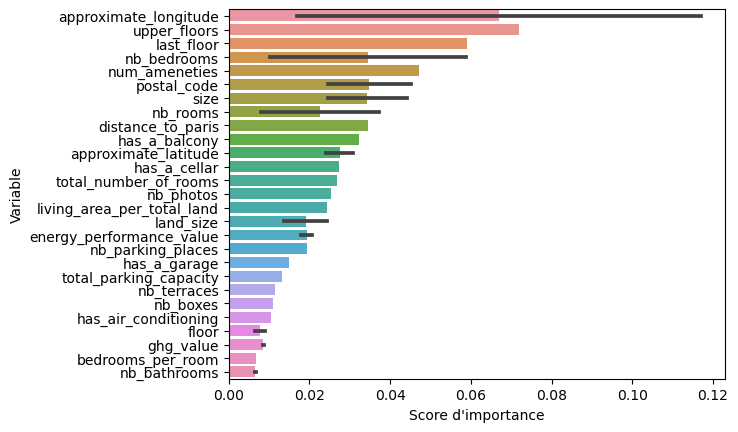

In [155]:
#plt.figure(figsize=(10, 16))
sns.barplot(data=imp_df, x="Score d'importance", y="Variable")

In [156]:
# Enregistrement
import joblib
joblib.dump(final_model, "final_model.joblib")

['final_model.joblib']

Nous arrivons à la fin de ce projet de modélisation. Le modèle présenté constitue une première version opérationnelle, mais comme tout projet de data science, il peut naturellement être amélioré. Toute remarque, suggestion ou piste d’optimisation sera donc la bienvenue afin d’affiner encore davantage les performances et la robustesse du modèle.